# **Connecting GDrive**

In [6]:
from google.colab import drive
drive.mount('/content/gdrive')
%cd /content/gdrive/MyDrive
!mkdir COCO-Human-Pose
%cd COCO-Human-Pose

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
/content/gdrive/MyDrive
mkdir: cannot create directory ‘COCO-Human-Pose’: File exists
/content/gdrive/MyDrive/COCO-Human-Pose


# **Installing required modules**

In [7]:
!pip install tensorflow keras opencv-python matplotlib numpy pycocotools scikit-learn requests
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from pycocotools.coco import COCO
import requests
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras import layers, Model

# **Data preparation functions**

In [8]:
def download_image(img_info, save_dir):
    file_path = os.path.join(save_dir, img_info['file_name'])
    if not os.path.exists(file_path):
        image_url = img_info['coco_url']
        img_data = requests.get(image_url).content
        with open(file_path, 'wb') as f:
            f.write(img_data)
    return file_path

def load_and_resize_image(img_path, target_size=(224, 224)):
    img = cv2.imread(img_path)
    if img is None:
        return None
    img_resized = cv2.resize(img, target_size)
    return img_resized / 255.0  # Normalize pixel values

def normalize_keypoints(keypoints, orig_w, orig_h):
    return [(x / orig_w, y / orig_h, v) for x, y, v in keypoints]

def denormalize_keypoints(normalized_keypoints, new_w, new_h):
    return [(int(x * new_w), int(y * new_h), v) for x, y, v in normalized_keypoints]

# **Heatmap Creation**

In [9]:
def create_heatmaps(keypoints_list, img_shape=(224, 224), num_keypoints=17, sigma=2):
    heatmaps = np.zeros((img_shape[0], img_shape[1], num_keypoints), dtype=np.float32)
    for keypoints in keypoints_list:
        for i in range(num_keypoints):
            x, y, v = keypoints[i]
            if v > 0:  # Check if the keypoint is visible
                x, y = int(x), int(y)
                if 0 <= x < img_shape[1] and 0 <= y < img_shape[0]:
                    gaussian = np.exp(-((np.arange(img_shape[1]) - x) ** 2 +
                                        (np.arange(img_shape[0])[:, np.newaxis] - y) ** 2) / (2 * sigma ** 2))
                    heatmaps[:, :, i] = np.maximum(heatmaps[:, :, i], gaussian)
    return heatmaps

def visualize_annotations(img, keypoints_list, title="Image with Annotations"):
    plt.figure(figsize=(10, 10))
    # Convert the image to uint8 before passing it to cv2.cvtColor
    plt.imshow(cv2.cvtColor(img.astype(np.uint8), cv2.COLOR_BGR2RGB))
    colors = plt.cm.rainbow(np.linspace(0, 1, 17))
    for keypoints in keypoints_list:
        for i, (x, y, v) in enumerate(keypoints):
            if v > 0:
                plt.scatter(x, y, color=colors[i], s=40, marker='o')
    plt.title(title)
    plt.axis('off')
    plt.show()

def visualize_heatmaps(heatmaps, title="Heatmaps"):
    plt.figure(figsize=(15, 8))
    num_heatmaps = heatmaps.shape[-1]
    for i in range(num_heatmaps):
        plt.subplot(3, 6, i+1)
        plt.imshow(heatmaps[:,:,i], cmap='hot')
        plt.title(f'Keypoint {i+1}')
        plt.axis('off')
    plt.tight_layout()
    plt.suptitle(title, y=1.02)
    plt.show()


# **Model definition**

In [10]:
def build_pose_model(input_shape=(224, 224, 3), num_keypoints=17):
    base_model = tf.keras.applications.MobileNetV2(input_shape=input_shape, include_top=False)
    x = base_model.output
    x = layers.Conv2D(512, (3, 3), activation='relu', padding='same')(x)
    x = layers.Conv2D(256, (3, 3), activation='relu', padding='same')(x)
    x = layers.UpSampling2D(size=(32, 32))(x)
    heatmap_output = layers.Conv2D(num_keypoints, (1, 1), activation='sigmoid')(x)
    model = Model(inputs=base_model.input, outputs=heatmap_output)
    return model

# **Downloading Dataset**

In [11]:
# Set up directories
data_dir = 'coco_dataset'
image_dir = os.path.join(data_dir, 'image_dir')
annotations_dir = os.path.join(data_dir, 'annotations')
os.makedirs(data_dir, exist_ok=True)
os.makedirs(image_dir, exist_ok=True)
os.makedirs(annotations_dir, exist_ok=True)

# Download COCO annotations
ann_file = os.path.join(annotations_dir, 'person_keypoints_train2017.json')
if not os.path.exists(ann_file):
    ann_url = 'http://images.cocodataset.org/annotations/annotations_trainval2017.zip'
    zip_file = os.path.join(annotations_dir, 'annotations_trainval2017.zip')
    response = requests.get(ann_url, stream=True)
    with open(zip_file, 'wb') as f:
        for chunk in response.iter_content(chunk_size=1024):
            if chunk:
                f.write(chunk)
    import zipfile
    with zipfile.ZipFile(zip_file, 'r') as zip_ref:
        zip_ref.extractall(annotations_dir)
    os.remove(zip_file)

# Load COCO annotations
coco = COCO(ann_file)

# Get image IDs that contain human keypoints
cat_ids = coco.getCatIds(catNms=['person'])
img_ids = coco.getImgIds(catIds=cat_ids)
img_ids = img_ids[:50]  # Download 500 images

# Download images
for i, img_id in enumerate(img_ids):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(image_dir, img_info['file_name'])
    if not os.path.exists(img_path):
        image_url = img_info['coco_url']
        img_data = requests.get(image_url).content
        with open(img_path, 'wb') as f:
            f.write(img_data)
    print(f"Downloaded image {i+1} of {len(img_ids)}")

loading annotations into memory...
Done (t=19.86s)
creating index...
index created!
Downloaded image 1 of 50
Downloaded image 2 of 50
Downloaded image 3 of 50
Downloaded image 4 of 50
Downloaded image 5 of 50
Downloaded image 6 of 50
Downloaded image 7 of 50
Downloaded image 8 of 50
Downloaded image 9 of 50
Downloaded image 10 of 50
Downloaded image 11 of 50
Downloaded image 12 of 50
Downloaded image 13 of 50
Downloaded image 14 of 50
Downloaded image 15 of 50
Downloaded image 16 of 50
Downloaded image 17 of 50
Downloaded image 18 of 50
Downloaded image 19 of 50
Downloaded image 20 of 50
Downloaded image 21 of 50
Downloaded image 22 of 50
Downloaded image 23 of 50
Downloaded image 24 of 50
Downloaded image 25 of 50
Downloaded image 26 of 50
Downloaded image 27 of 50
Downloaded image 28 of 50
Downloaded image 29 of 50
Downloaded image 30 of 50
Downloaded image 31 of 50
Downloaded image 32 of 50
Downloaded image 33 of 50
Downloaded image 34 of 50
Downloaded image 35 of 50
Downloaded imag

# **Organising and Visualization**

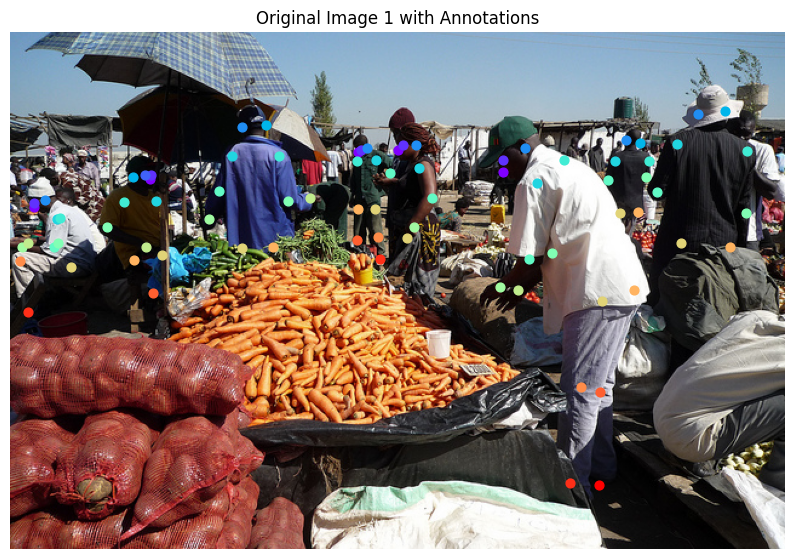

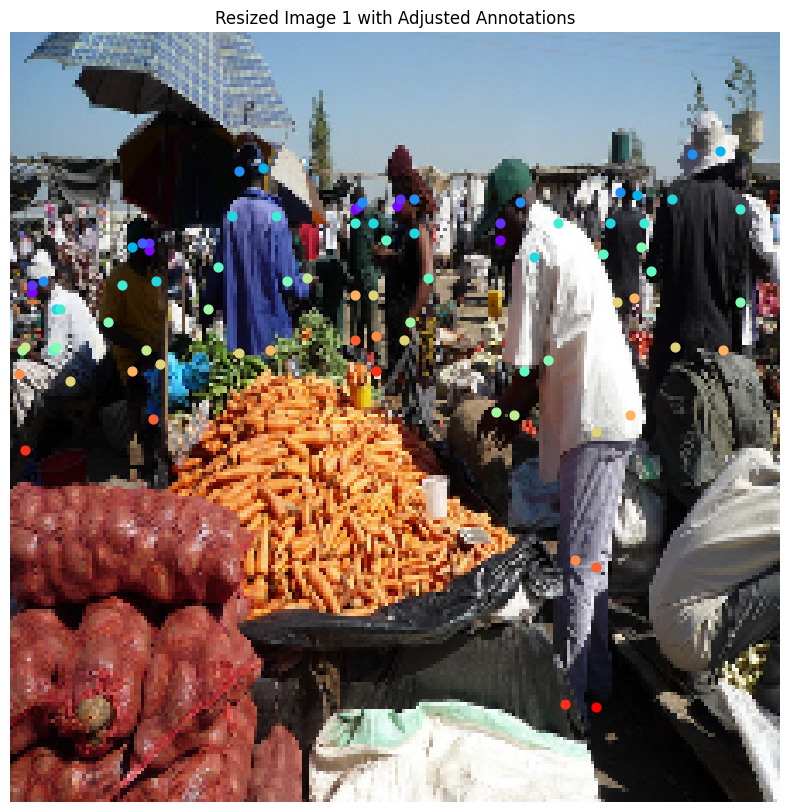

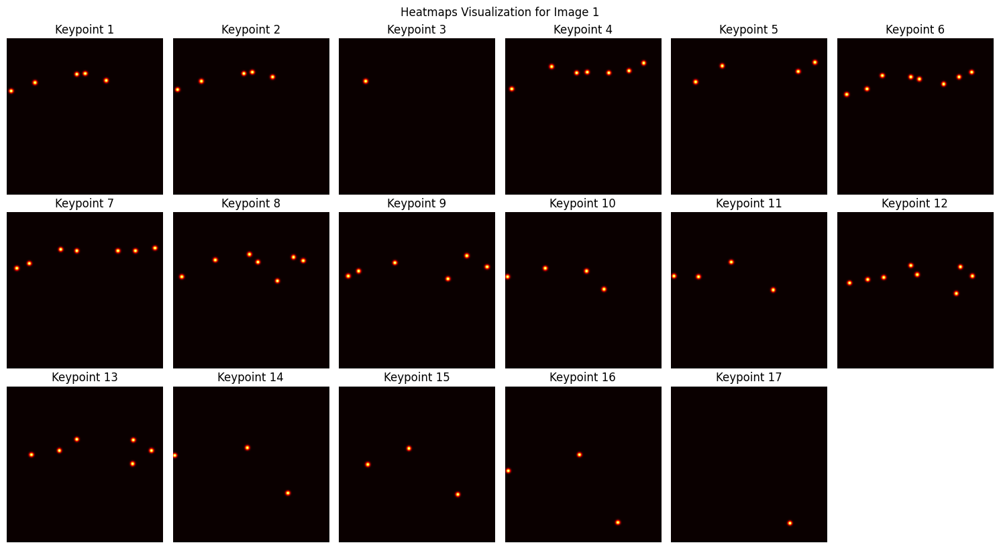

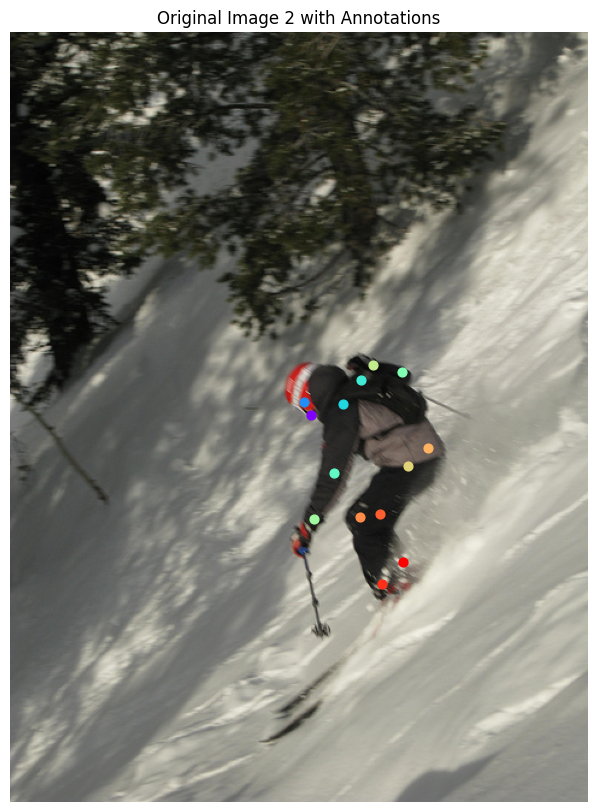

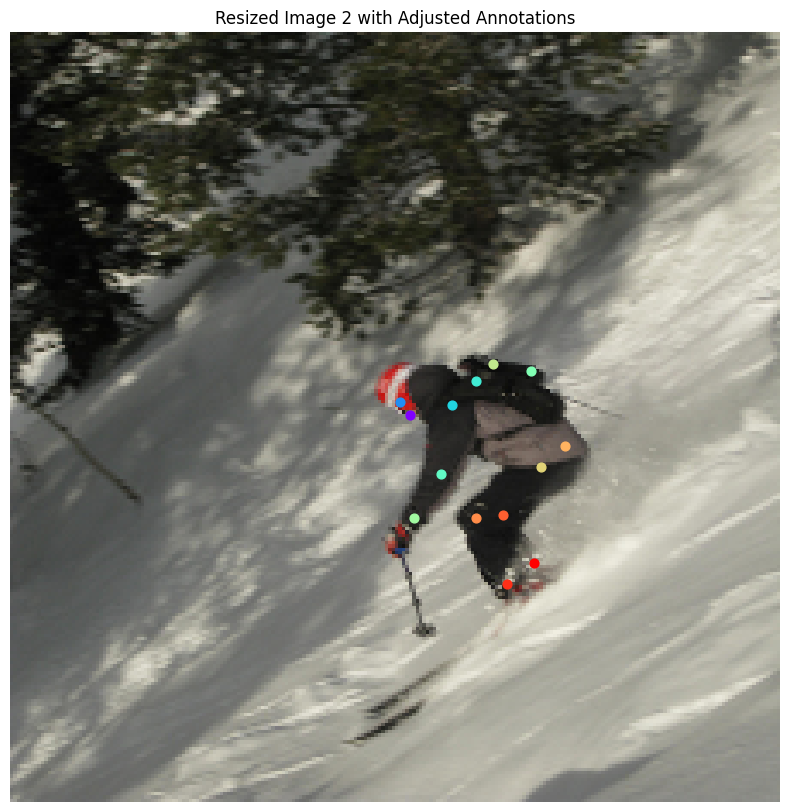

...

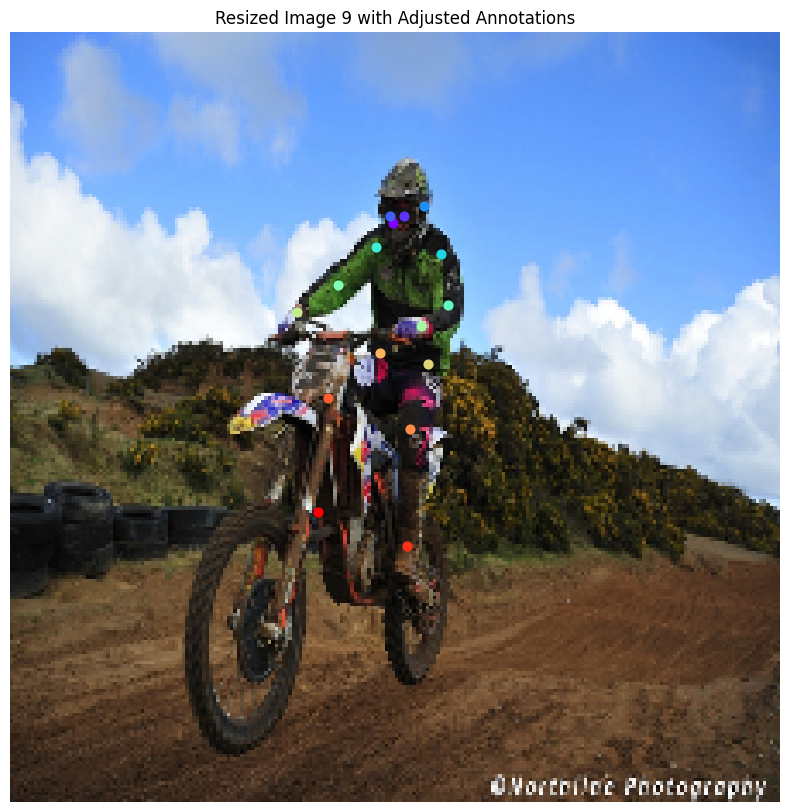

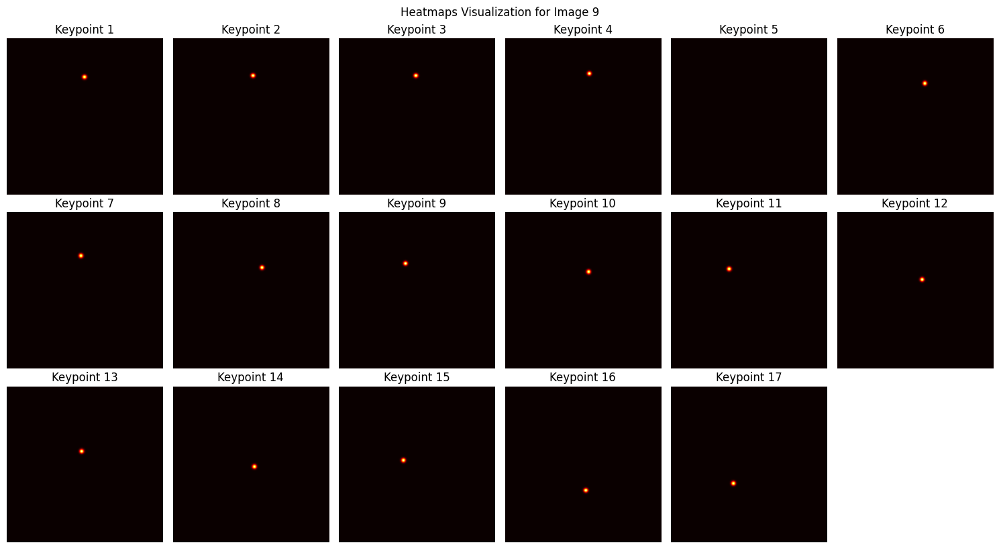

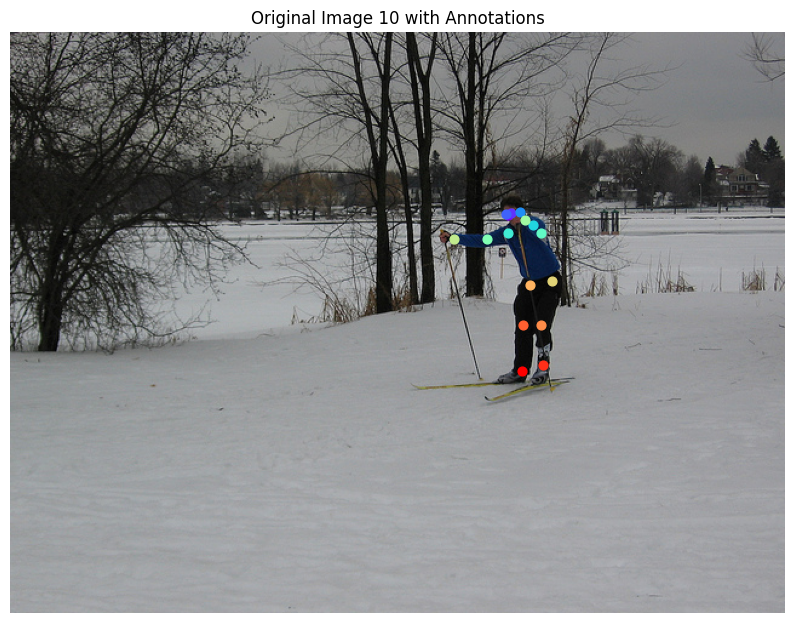

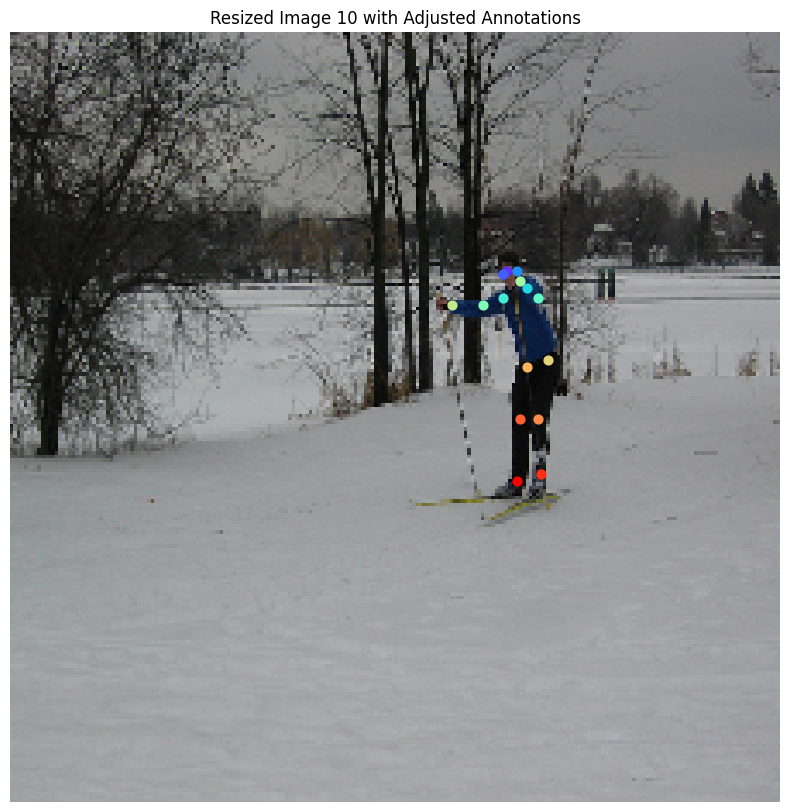

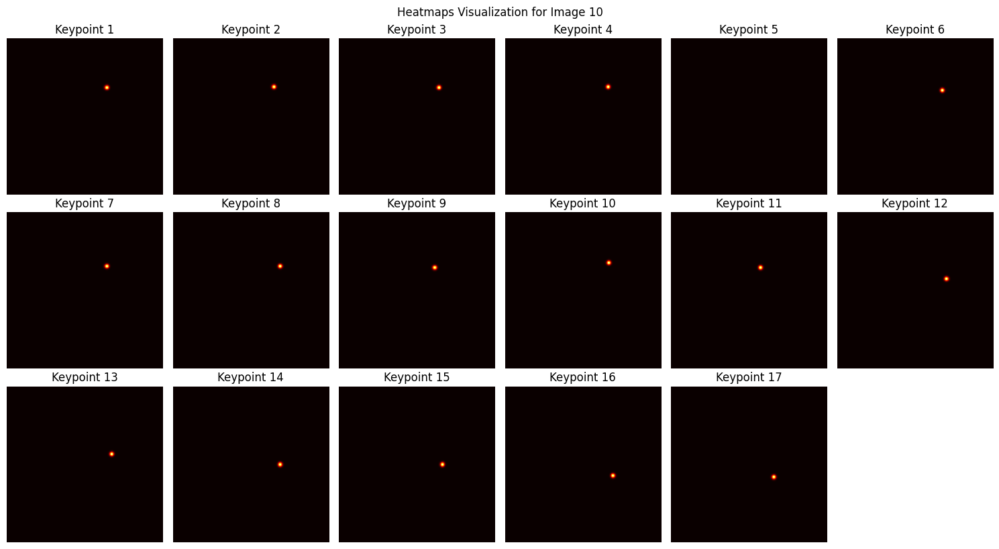

Training data shape: (50, 224, 224, 3)
Keypoint data shape: (50, 224, 224, 17)


In [12]:
# Load images and keypoints
training_data = []
keypoint_data = []

for i, img_id in enumerate(img_ids):
    img_info = coco.loadImgs(img_id)[0]
    img_path = os.path.join(image_dir, img_info['file_name'])
    original_img = cv2.imread(img_path)

    if original_img is None:
        print(f"Failed to load image: {img_info['file_name']}")
        continue

    original_height, original_width = img_info['height'], img_info['width']
    img_resized = load_and_resize_image(img_path)

    ann_ids = coco.getAnnIds(imgIds=img_id, iscrowd=False)
    anns = coco.loadAnns(ann_ids)

    keypoints_list = [np.array(ann['keypoints']).reshape(-1, 3) for ann in anns]
    normalized_keypoints = [normalize_keypoints(kps, original_width, original_height) for kps in keypoints_list]
    adjusted_keypoints = [denormalize_keypoints(kps, 224, 224) for kps in normalized_keypoints]

    # Visualize only the first 10 images
    if i < 10:
        visualize_annotations(original_img, keypoints_list, title=f"Original Image {i+1} with Annotations")
        visualize_annotations(img_resized * 255, adjusted_keypoints, title=f"Resized Image {i+1} with Adjusted Annotations")

        heatmaps = create_heatmaps(adjusted_keypoints, img_shape=(224, 224))
        visualize_heatmaps(heatmaps, title=f"Heatmaps Visualization for Image {i+1}")

    training_data.append(img_resized)
    keypoint_data.append(create_heatmaps(adjusted_keypoints, img_shape=(224, 224)))

# Convert to numpy arrays
training_data = np.array(training_data)
keypoint_data = np.array(keypoint_data)
print(f"Training data shape: {training_data.shape}")
print(f"Keypoint data shape: {keypoint_data.shape}")

# Train-Test Split
train_images, test_images, train_keypoints, test_keypoints = train_test_split(
    training_data, keypoint_data, test_size=0.2, random_state=42
)


# **Build and train the model**

In [13]:
pose_model = build_pose_model()
pose_model.compile(optimizer='adam', loss='mse', metrics=['mae'])
pose_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 9,341,009 (35.63 MB)

 Trainable params: 9,306,897 (35.50 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [14]:
# Visualize some predictions
def visualize_predictions(image, true_heatmaps, pred_heatmaps):
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image)
    plt.title("Input Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    plt.imshow(np.sum(true_heatmaps, axis=-1), cmap='hot')
    plt.title("Predicted Heatmap")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

# *Train*

In [15]:
history = pose_model.fit(
    train_images, train_keypoints,
    epochs=100,
    batch_size=32,
    validation_data=(test_images, test_keypoints),
    callbacks=[
        tf.keras.callbacks.EarlyStopping(patience=20, restore_best_weights=True),
        tf.keras.callbacks.ReduceLROnPlateau(factor=0.1, patience=10, min_lr=1e-6),
        tf.keras.callbacks.ModelCheckpoint('best_pose_model.keras', save_best_only=True)
    ]
)

# Save the model
pose_model.save('pose_estimation_model.keras')

Epoch 1/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 95s 35s/step - loss: 0.2396 - mae: 0.4217 - val_loss: 6.7916e-04 - val_mae: 0.0014 - learning_rate: 0.0010
Epoch 2/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 14s 181ms/step - loss: 3.9523e-04 - mae: 9.5989e-04 - val_loss: 6.7916e-04 - val_mae: 0.0014 - learning_rate: 0.0010
Epoch 3/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 3.6560e-04 - mae: 7.3986e-04 - val_loss: 6.7916e-04 - val_mae: 0.0014 - learning_rate: 0.0010
Epoch 4/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 3.5610e-04 - mae: 7.0989e-04 - val_loss: 6.7916e-04 - val_mae: 0.0014 - learning_rate: 0.0010
Epoch 5/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 155ms/step - loss: 3.7252e-04 - mae: 7.4254e-04 - val_loss: 6.7916e-04 - val_mae: 0.0014 - learning_rate: 0.0010
Epoch 6/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 1s 148ms/step - loss: 3.5267e-04 - mae: 7.0260e-04 - val_loss: 6.7916e-04 - val_mae: 0.0014 - learning_rate: 0.0010
Epoch 7/100
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 3.6868e-04 - mae: 7.3479e-04 - 

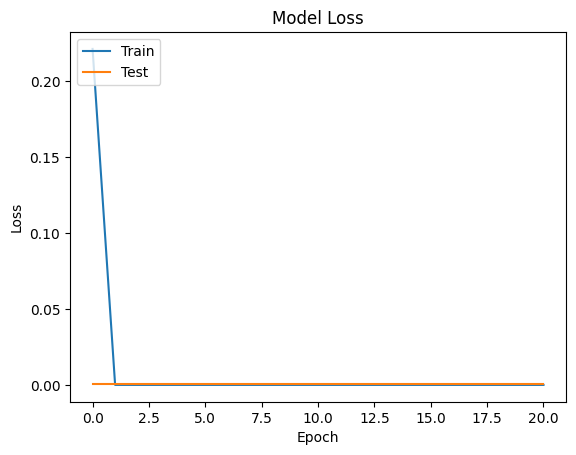

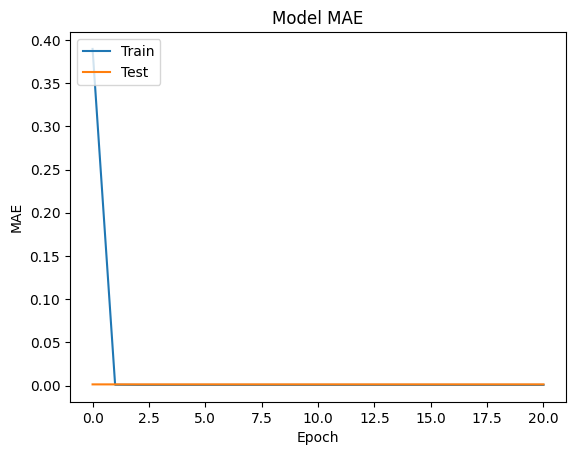

In [16]:
# Plot training and validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

# Plot training and validation accuracy values
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.title('Model MAE')
plt.ylabel('MAE')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()


# **Evaluate the model**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 6.7916e-04 - mae: 0.0014
Test Loss: 0.0006791603518649936, Test MAE: 0.0013510376447811723
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


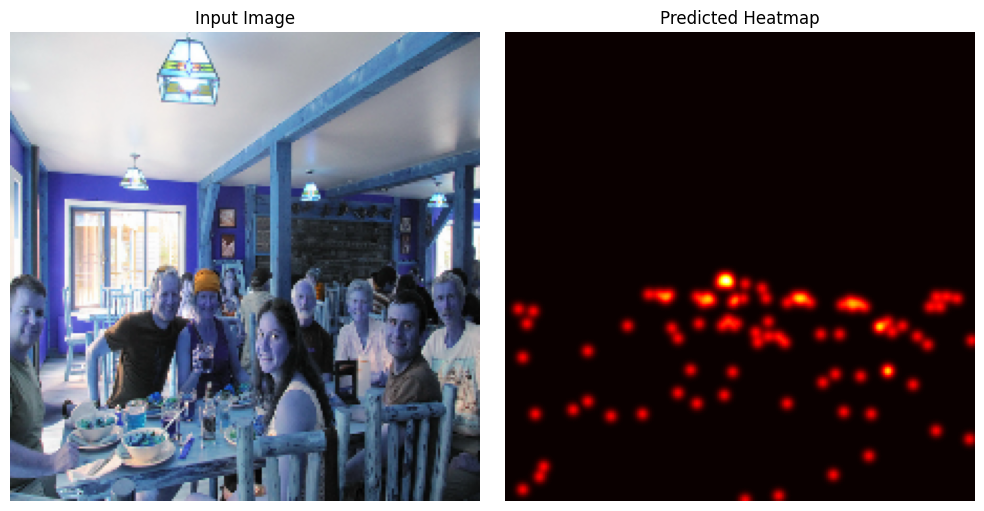

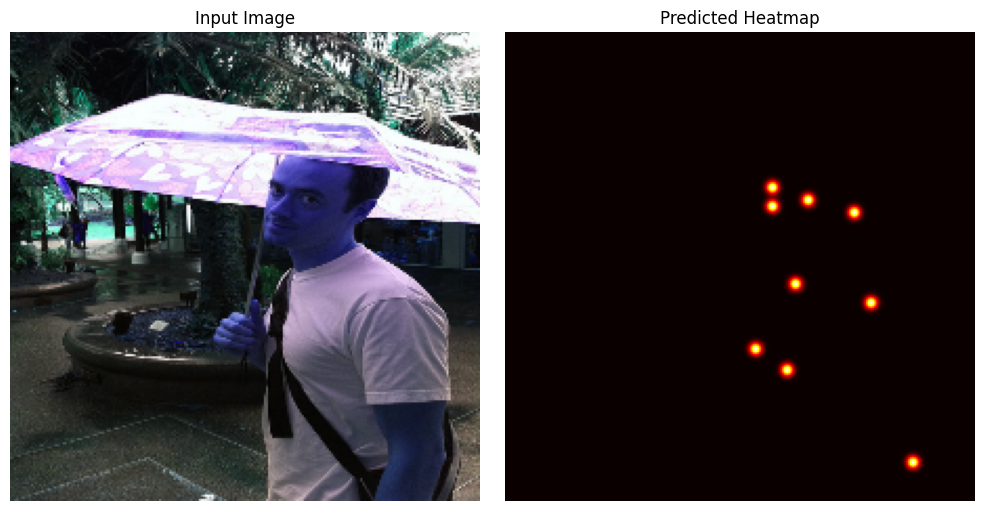

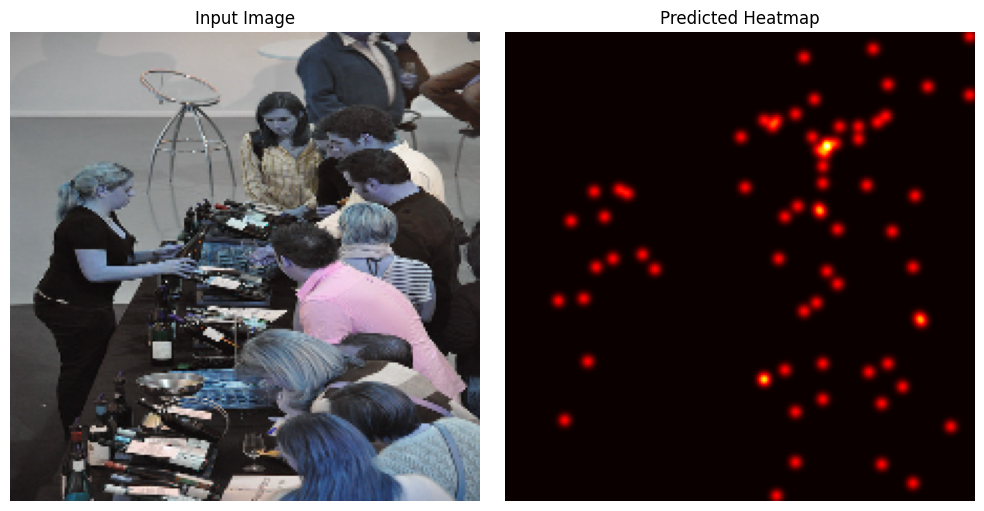

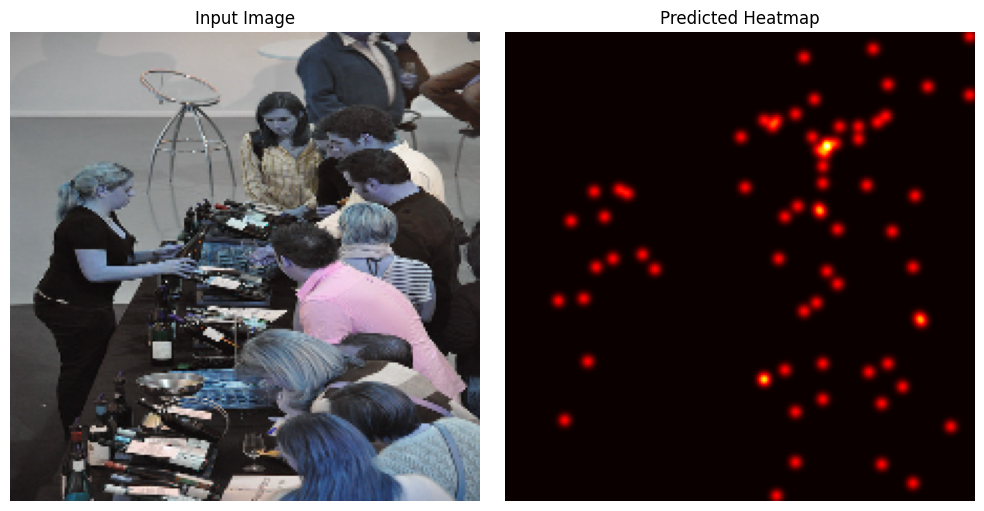

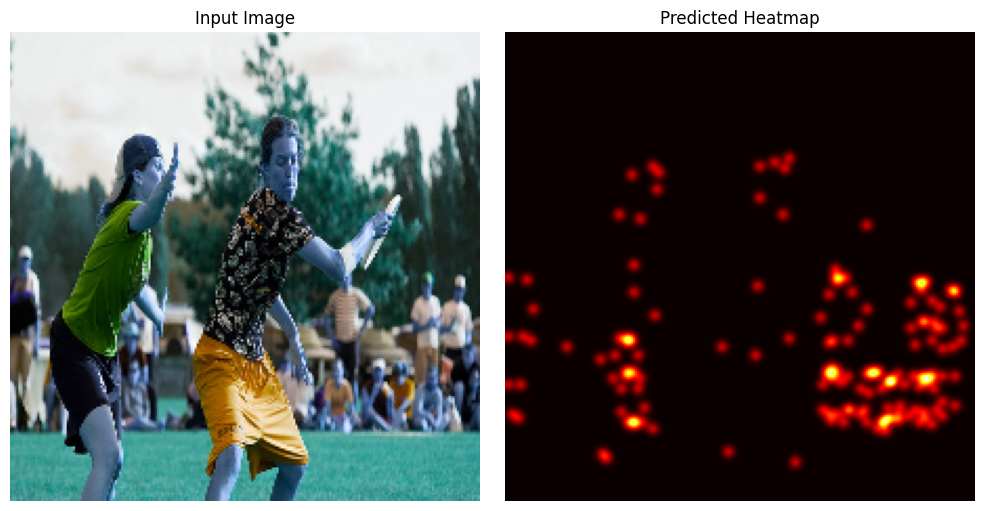

In [17]:
test_loss, test_mae = pose_model.evaluate(test_images, test_keypoints)
print(f"Test Loss: {test_loss}, Test MAE: {test_mae}")
# Make predictions
test_predictions = pose_model.predict(test_images)


for i in range(5):  # Visualize 5 random samples
    idx = np.random.randint(len(test_images))
    visualize_predictions(test_images[idx], test_keypoints[idx], test_predictions[idx])